<a href="https://colab.research.google.com/github/RoadScanSolutionsTeam/RoadScan/blob/main/Model/jalanrusak_yolov8s.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="G0NQkJsvOQBXaZizxR3r")
project = rf.workspace("tugas-xogo7").project("jalanrusak-zofhk")
version = project.version(6)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.3 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to JalanRusak-6 in yolov8:: 100%|██████████| 9978/9978 [00:03<00:00, 2656.17it/s]


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.5/887.5 kB 23.1 MB/s eta 0:00:00


In [ ]:
# import library

# for extracting zip file
import os
import zipfile

# for modelling
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# count of images

def count_images_in_folder(folder_path):
  image_count = 0
  for filename in os.listdir(folder_path):
    if filename.endswith((".jpg", ".jpeg", ".png")):
      image_count += 1
  return image_count


train_image_folder = '/content/JalanRusak-6/train/images'
val_image_folder = '/content/JalanRusak-6/valid/images'
test_image_folder = '/content/JalanRusak-6/test/images'

train_image_count = count_images_in_folder(train_image_folder)
val_image_count = count_images_in_folder(val_image_folder)
test_image_count = count_images_in_folder(test_image_folder)

print(f"Number of images in train folder: {train_image_count}")
print(f"Number of images in val folder: {val_image_count}")
print(f"Number of images in test folder: {test_image_count}")

Number of images in train folder: 4098
Number of images in val folder: 591
Number of images in test folder: 294


In [ ]:
# sum of images

total_images = train_image_count + val_image_count + test_image_count
print(f"Total number of images in all folders: {total_images}")

Total number of images in all folders: 4983


In [ ]:
# count of labels

import os

def count_classes_in_folder(folder_path):
  """Counts the number of unique class labels within a folder containing images and labels.

  Args:
    folder_path: The path to the folder.

  Returns:
    A set of unique class labels found in the folder.
  """
  class_labels = set()
  for filename in os.listdir(folder_path):
    if filename.endswith(".txt"):  # Assuming labels are in .txt files
      filepath = os.path.join(folder_path, filename)
      with open(filepath, 'r') as f:
        for line in f:
          class_id = int(line.split()[0])
          class_labels.add(class_id)
  return class_labels


train_folder = '/content/JalanRusak-6/train/labels'
val_folder = '/content/JalanRusak-6/valid/labels'
test_folder = '/content/JalanRusak-6/test/labels'


train_classes = count_classes_in_folder(train_folder)
val_classes = count_classes_in_folder(val_folder)
test_classes = count_classes_in_folder(test_folder)

print(f"Number of classes in train folder: {len(train_classes)}")
print(f"Number of classes in val folder: {len(val_classes)}")
print(f"Number of classes in test folder: {len(test_classes)}")

Number of classes in train folder: 6
Number of classes in val folder: 6
Number of classes in test folder: 6


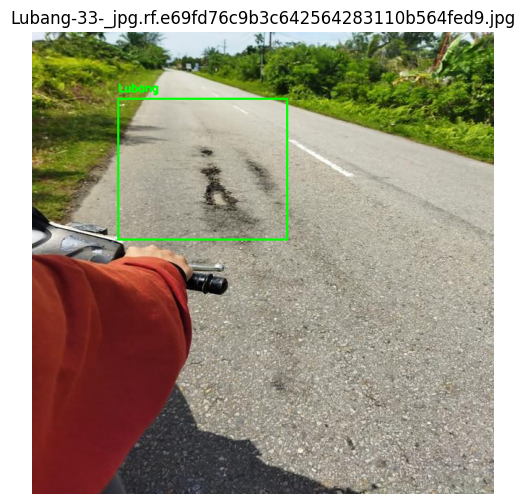

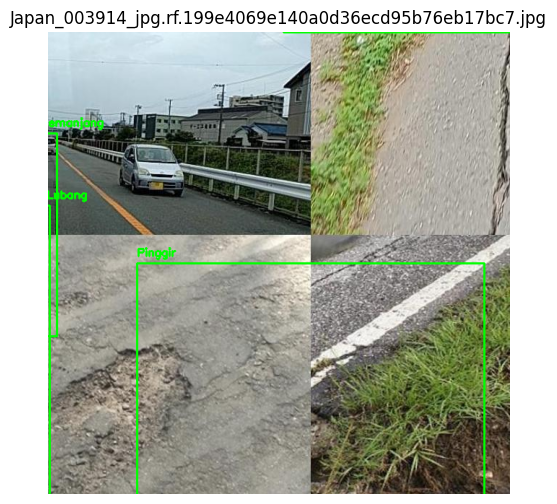

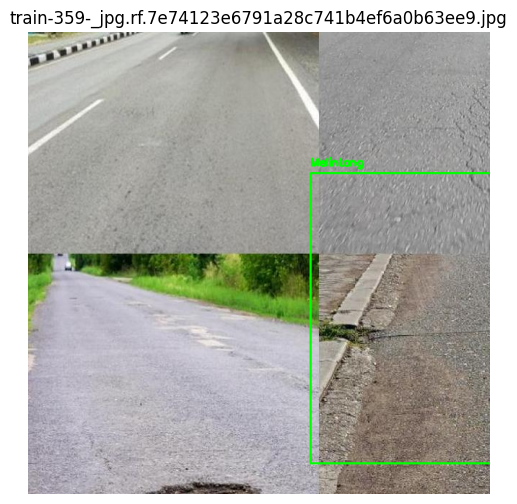

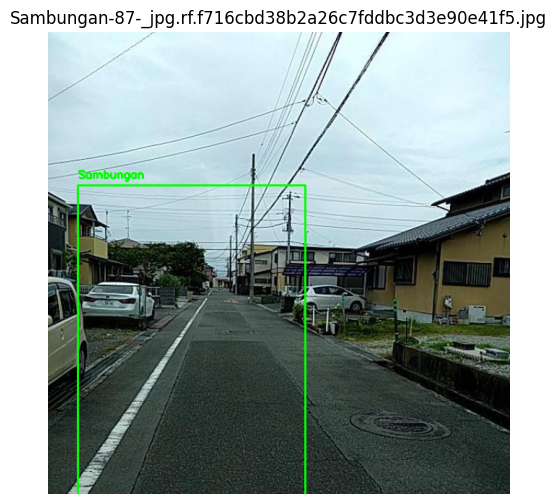

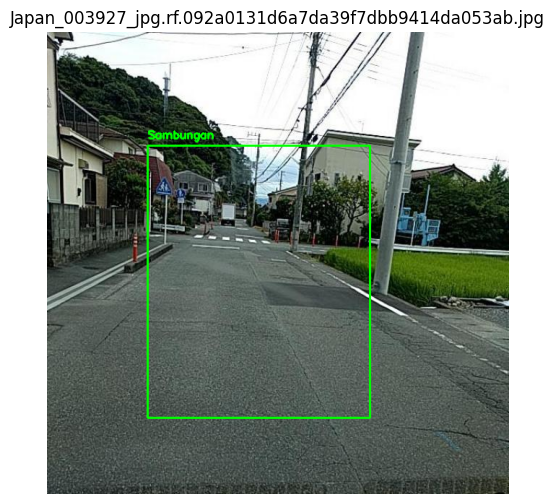

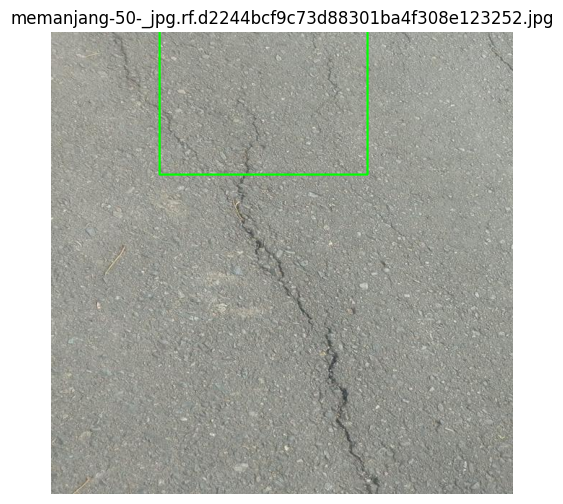

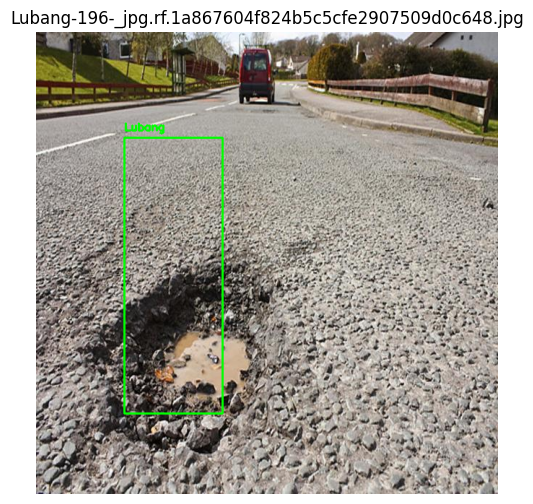

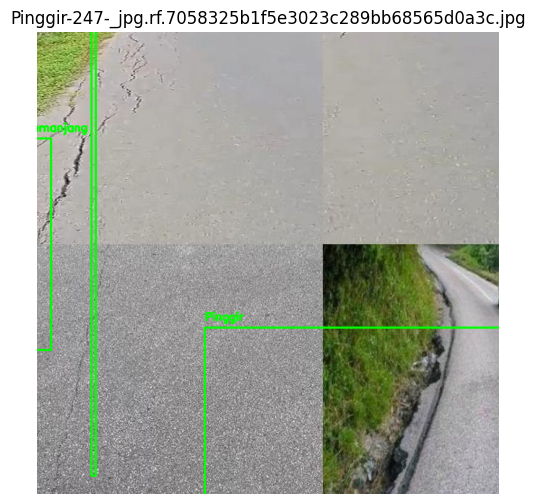

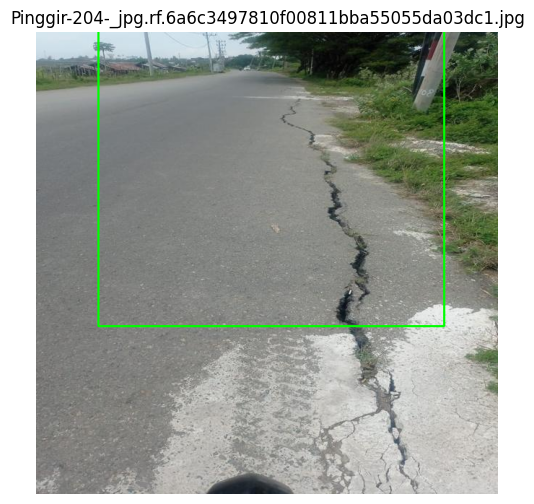

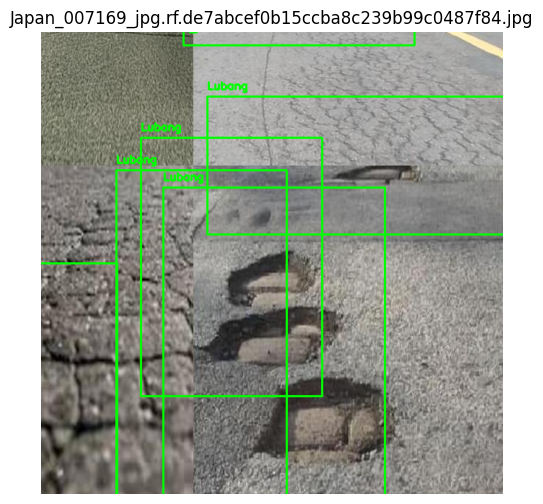

In [ ]:
import os
import cv2
from matplotlib import pyplot as plt

# Define class names based on your data.yaml
class_names = ["Lubang", "Melintang", "Memanjang", "Pinggir", "Retak Buaya", "Sambungan"]

def show_images_with_labels(image_folder, label_folder, num_images=5):
    """Displays images from a folder along with their corresponding labels.

    Args:
        image_folder: Path to the folder containing images.
        label_folder: Path to the folder containing label files.
        num_images: Number of images to display.
    """

    image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
    for image_file in image_files[:num_images]:
        image_path = os.path.join(image_folder, image_file)
        label_file = os.path.join(label_folder, image_file.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt'))

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if os.path.exists(label_file):
            with open(label_file, 'r') as f:
                for line in f:
                    # Split the line and check if it has enough elements
                    elements = line.split()
                    if len(elements) >= 5:  # Ensure there are at least 5 elements
                        class_id, x_center, y_center, width, height = map(float, elements[:5])  # Take the first 5 elements
                        img_height, img_width, _ = img.shape
                        x_min = int((x_center - width / 2) * img_width)
                        y_min = int((y_center - height / 2) * img_height)
                        x_max = int((x_center + width / 2) * img_width)
                        y_max = int((y_center + height / 2) * img_height)

                        # Get the class name based on the class_id
                        class_name = class_names[int(class_id)] if int(class_id) < len(class_names) else f"Unknown Class {int(class_id)}"

                        # Draw bounding box and label on the image
                        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
                        cv2.putText(img, class_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
                    else:
                        print(f"Warning: Skipping line in {label_file} due to insufficient elements: {line}")

        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        plt.title(image_file)
        plt.axis('off')
        plt.show()

# Paths to your image and label folders
train_image_folder = '/content/JalanRusak-6/train/images'
train_label_folder = '/content/JalanRusak-6/train/labels'

# Display 10 images with labels
show_images_with_labels(train_image_folder, train_label_folder, num_images=10)

In [ ]:
def count_class_occurrences(label_folder, class_names):
  """Counts the number of occurrences of each class in a folder of label files.

  Args:
    label_folder: The path to the folder containing label files.
    class_names: A list of class names.

  Returns:
    A dictionary where keys are class names and values are the number of occurrences.
  """
  class_counts = {class_name: 0 for class_name in class_names}
  for filename in os.listdir(label_folder):
    if filename.endswith(".txt"):
      filepath = os.path.join(label_folder, filename)
      with open(filepath, 'r') as f:
        for line in f:
          class_id = int(line.split()[0])
          if class_id < len(class_names):
            class_counts[class_names[class_id]] += 1
  return class_counts


train_label_folder = '/content/JalanRusak-6/train/labels'
val_label_folder = '/content/JalanRusak-6/valid/labels'
test_label_folder = '/content/JalanRusak-6/test/labels'

train_class_counts = count_class_occurrences(train_label_folder, class_names)
val_class_counts = count_class_occurrences(val_label_folder, class_names)
test_class_counts = count_class_occurrences(test_label_folder, class_names)

print("Class Counts in Train Folder:")
for class_name, count in train_class_counts.items():
  print(f"{class_name}: {count}")

print("\nClass Counts in Validation Folder:")
for class_name, count in val_class_counts.items():
  print(f"{class_name}: {count}")

print("\nClass Counts in Test Folder:")
for class_name, count in test_class_counts.items():
  print(f"{class_name}: {count}")

Class Counts in Train Folder:
Lubang: 2106
Melintang: 1473
Memanjang: 2172
Pinggir: 1603
Retak Buaya: 1218
Sambungan: 1381

Class Counts in Validation Folder:
Lubang: 167
Melintang: 127
Memanjang: 181
Pinggir: 95
Retak Buaya: 92
Sambungan: 146

Class Counts in Test Folder:
Lubang: 61
Melintang: 74
Memanjang: 75
Pinggir: 81
Retak Buaya: 57
Sambungan: 52


# Modelling

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data="/content/JalanRusak-6/data.yaml" epochs=50 batch=32 imgsz=640 plots=True

100% 21.5M/21.5M [00:00<00:00, 233MB/s]
Ultralytics 8.3.37 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/JalanRusak-6/data.yaml, epochs=50, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False,

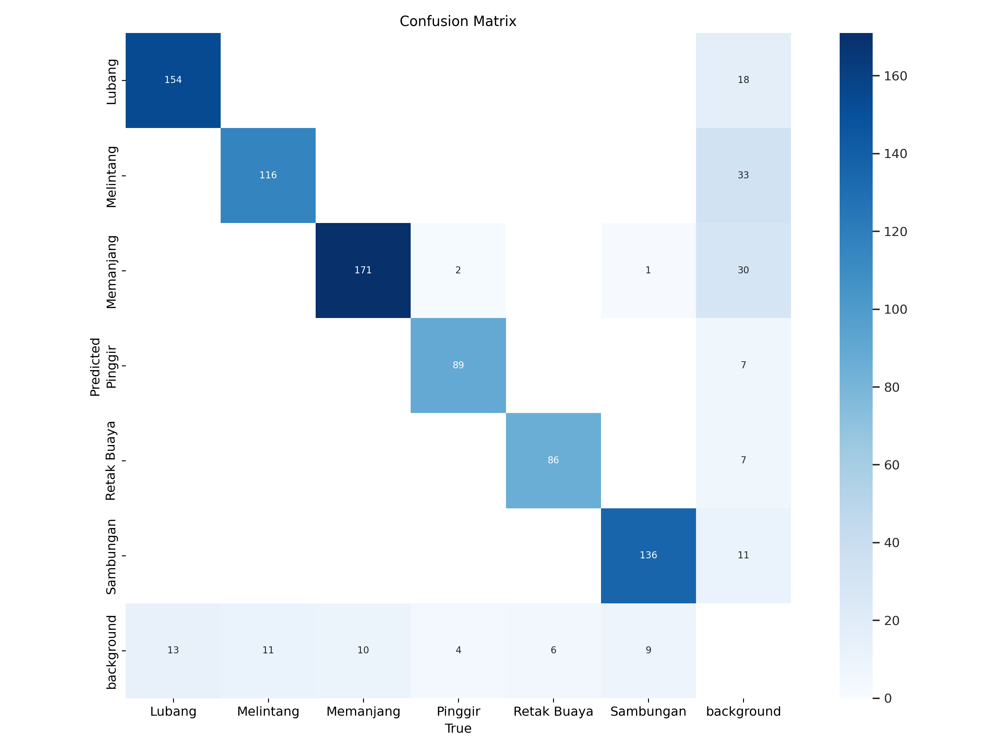

In [ ]:
from IPython.display import Image

path= "/content/runs/detect"
Image(filename=f"{path}/train/confusion_matrix.png", width=600)

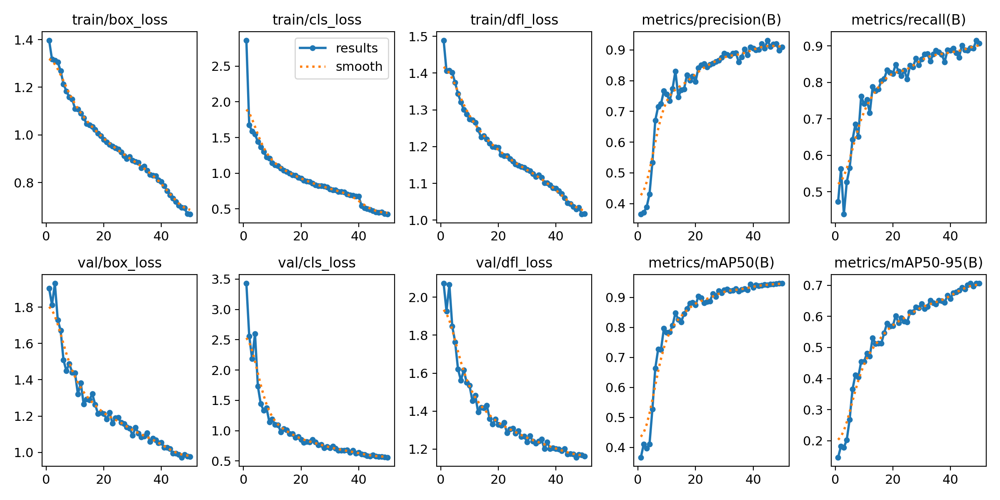

In [ ]:
Image(filename=f"{path}/train/results.png", width=600)

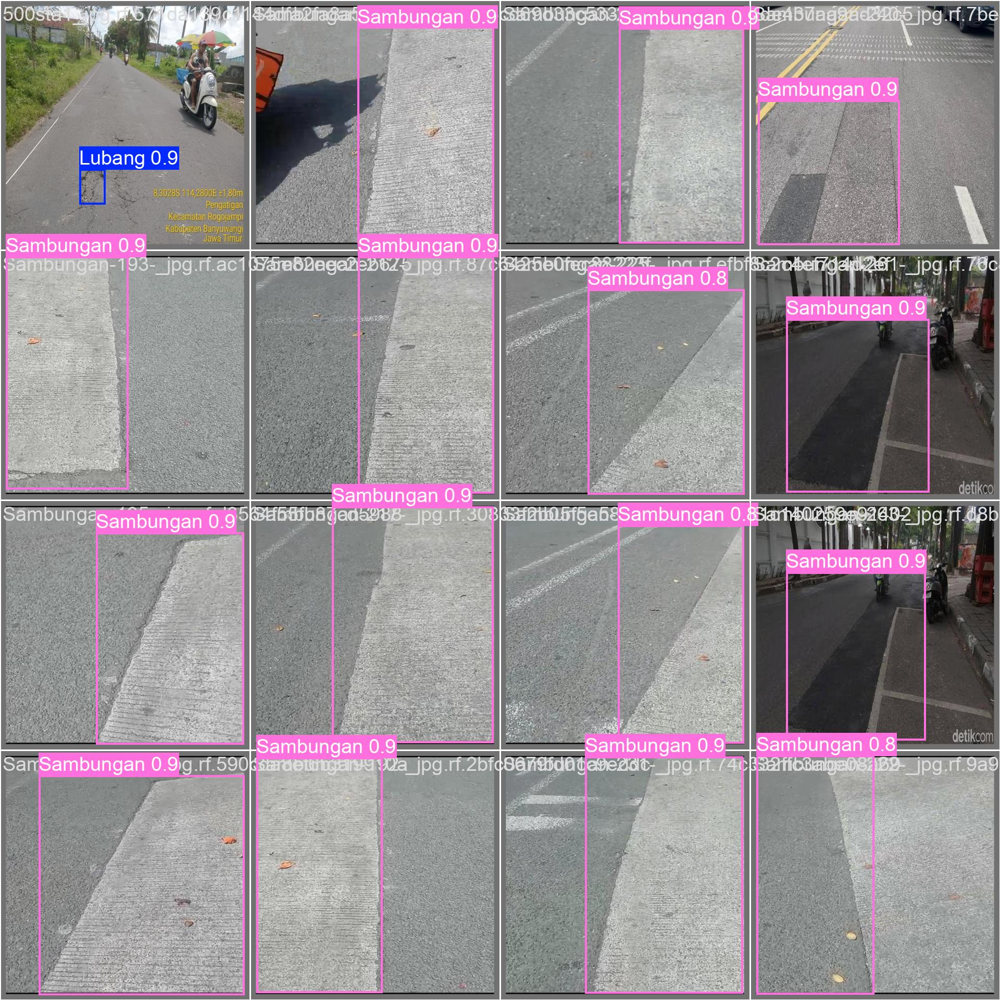

In [ ]:
Image(filename=f"{path}/train/val_batch0_pred.jpg", width=600)

In [ ]:
!yolo task=detect mode=val model={path}/train/weights/best.pt data="/content/JalanRusak-6/data.yaml"

Ultralytics 8.3.37 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,906 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/JalanRusak-6/valid/labels.cache... 591 images, 0 backgrounds, 0 corrupt: 100% 591/591 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 807, len(boxes) = 808. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 37/37 [00:08<00:00,  4.25it/s]
                   all        591        808      0.902      0.908      0.947      0.707
                Lubang        107        167      0.908      0.898      0.957      0.674
             Melintang         94        127      0.832      0.882       0.91      0.638
             Memanjang        136        181

In [ ]:
!yolo task=detect mode=predict model={path}/train/weights/best.pt conf=0.5 source="/content/JalanRusak-6/test/images" save=True

Ultralytics 8.3.37 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,906 parameters, 0 gradients, 28.4 GFLOPs

image 1/294 /content/JalanRusak-6/test/images/Buaya-103-_jpg.rf.fa05659a0daad8a170167ef55a63a0b0.jpg: 640x640 1 Retak Buaya, 17.2ms
image 2/294 /content/JalanRusak-6/test/images/Buaya-119-_jpg.rf.9b4b365373d690ffdfffa5d1517b27dd.jpg: 640x640 1 Retak Buaya, 16.4ms
image 3/294 /content/JalanRusak-6/test/images/Buaya-128-_jpg.rf.5c4f54ab8d6bcdedc01b17f4a96c86d7.jpg: 640x640 1 Retak Buaya, 16.3ms
image 4/294 /content/JalanRusak-6/test/images/Buaya-129-_jpg.rf.af7e2c6f49cdf961b0a1ad59372bcbda.jpg: 640x640 1 Retak Buaya, 16.2ms
image 5/294 /content/JalanRusak-6/test/images/Buaya-132-_jpg.rf.763be7143a04b79a1be843e6c7ad86c2.jpg: 640x640 1 Retak Buaya, 16.2ms
image 6/294 /content/JalanRusak-6/test/images/Buaya-134-_jpg.rf.a25662c81b26228cdc575082db2ab722.jpg: 640x640 1 Retak Buaya, 16.2ms
image 7/294 /content/JalanRusak-6/test/ima

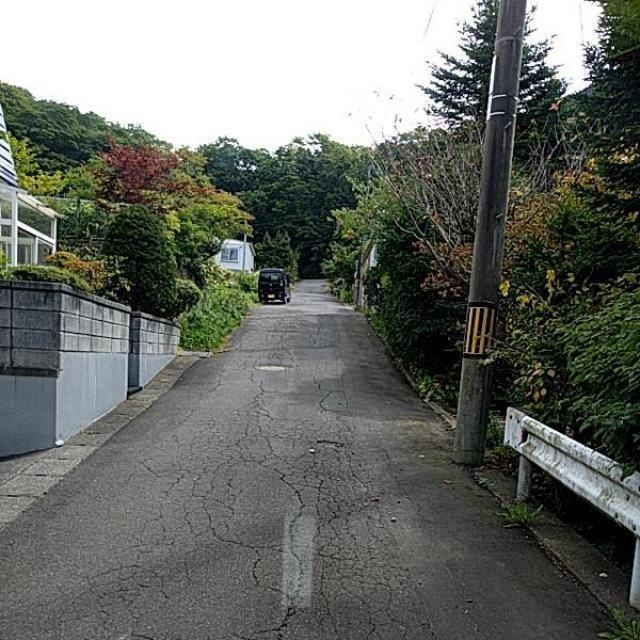

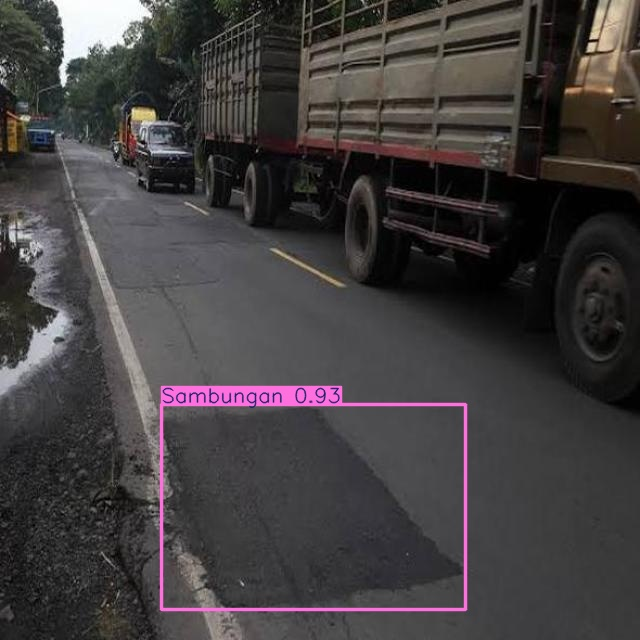

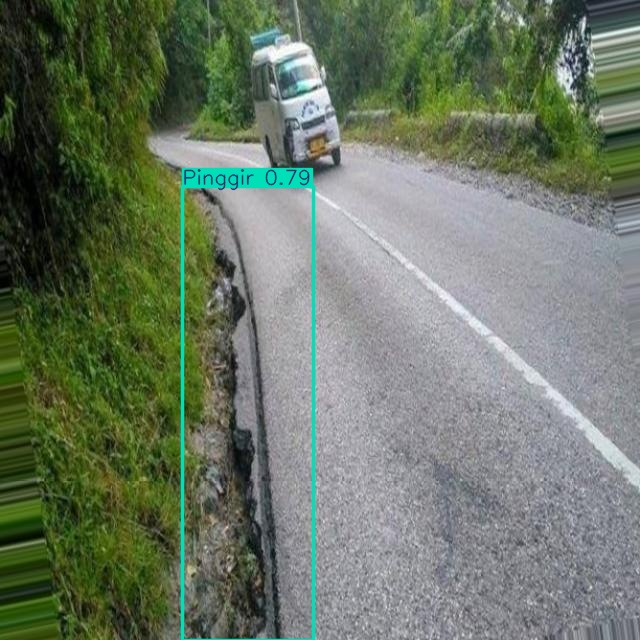

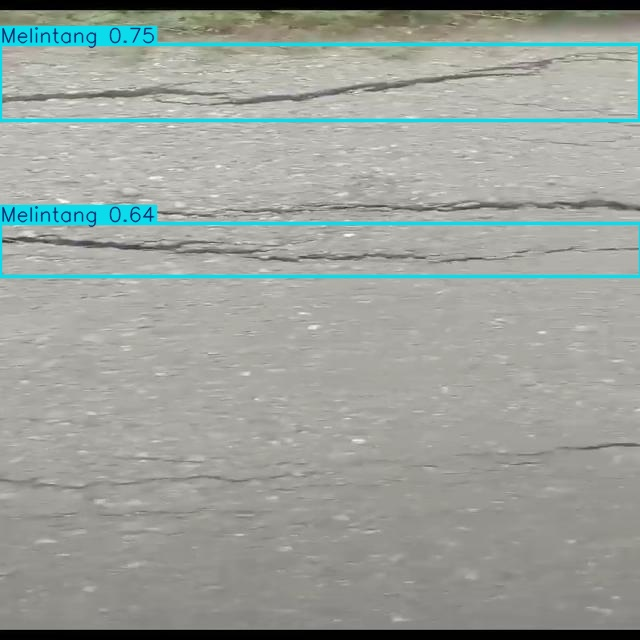

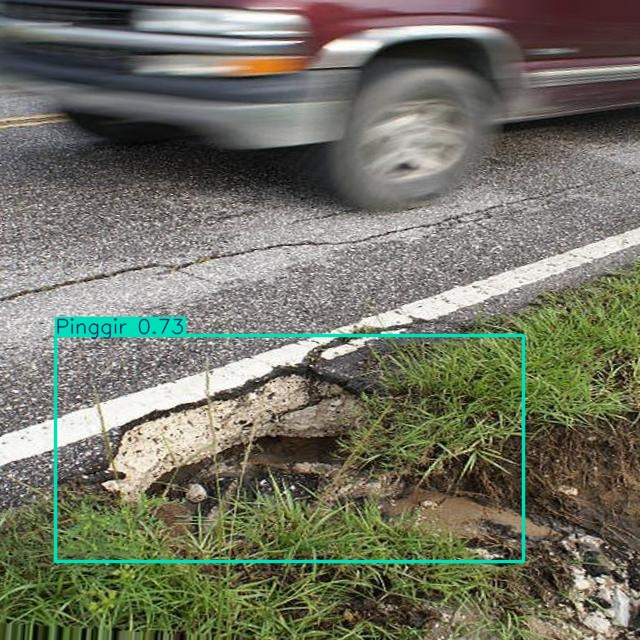

...

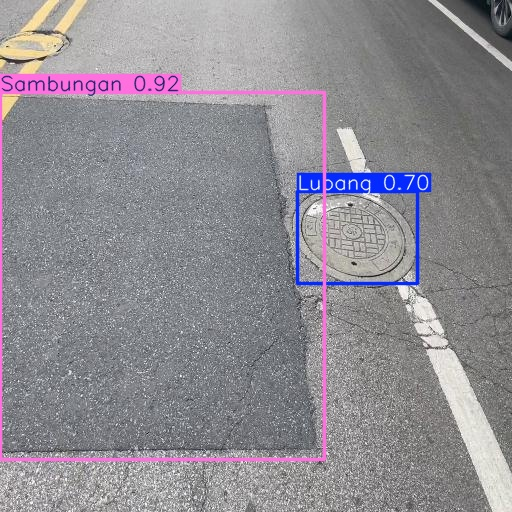

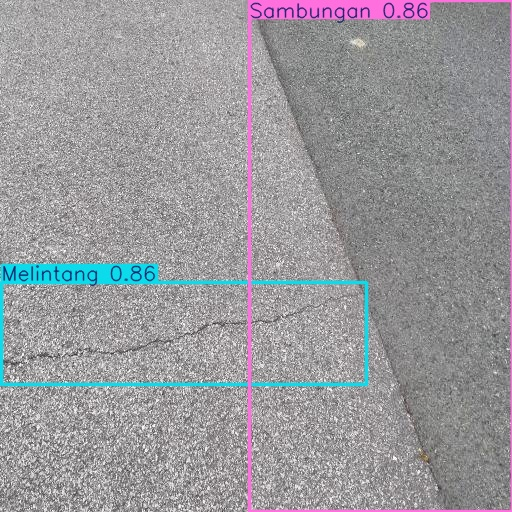

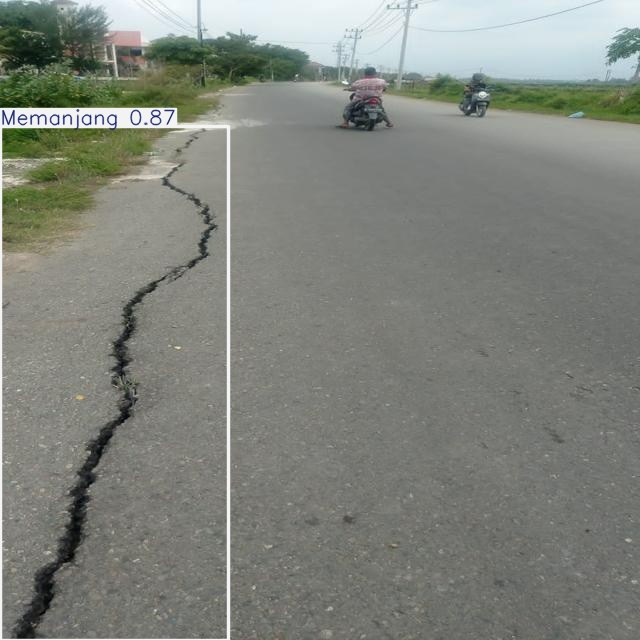

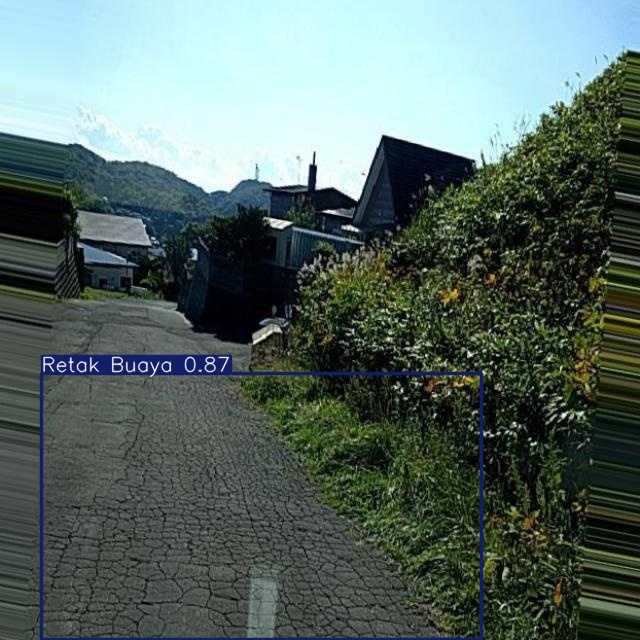

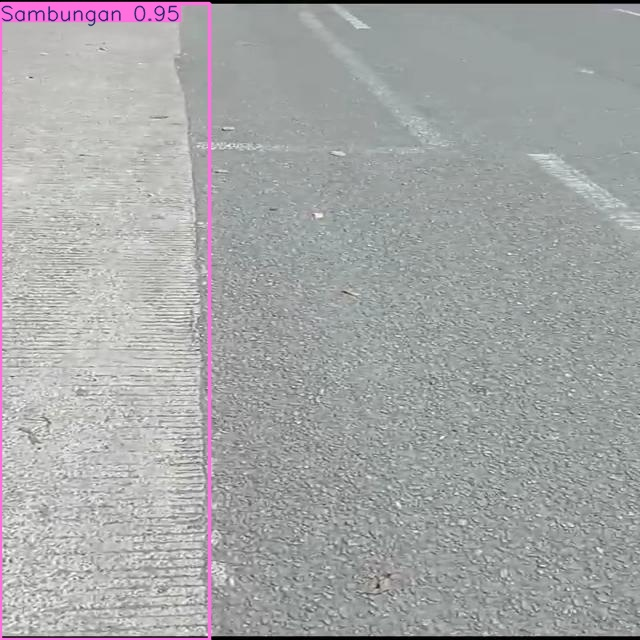

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{path}/predict/*.jpg')[100:150]:
    display(Image(filename=image_path, width=600))
    print("\n")

In [ ]:
# Testing with new image
!yolo task=detect mode=predict model={path}/train/weights/best.pt conf=0.5 source="/content/testing1.jpg" save=True

Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,906 parameters, 0 gradients, 28.4 GFLOPs

image 1/1 /content/testing1.jpg: 448x640 1 Lubang, 1 Retak Buaya, 38.2ms
Speed: 4.1ms preprocess, 38.2ms inference, 534.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
# Testing with new video
# !yolo task=detect mode=predict model={path}/train/weights/best.pt conf=0.5 source="/content/pothole-testing-480-publer.io.mp4" save=True

Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,127,906 parameters, 0 gradients, 28.4 GFLOPs

video 1/1 (frame 1/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 41.9ms
video 1/1 (frame 2/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 10.7ms
video 1/1 (frame 3/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 10.6ms
video 1/1 (frame 4/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 10.7ms
video 1/1 (frame 5/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 10.6ms
video 1/1 (frame 6/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 10.7ms
video 1/1 (frame 7/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 10.6ms
video 1/1 (frame 8/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lubang, 10.7ms
video 1/1 (frame 9/3996) /content/pothole-testing-480-publer.io.mp4: 384x640 1 Lub